In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/bsl-dataset-credits-to-eren-tatepe/2_HAND_DATASET/2_HAND_DATASET/X - x/2015.png
/kaggle/input/bsl-dataset-credits-to-eren-tatepe/2_HAND_DATASET/2_HAND_DATASET/X - x/2300.png
/kaggle/input/bsl-dataset-credits-to-eren-tatepe/2_HAND_DATASET/2_HAND_DATASET/X - x/3765.png
/kaggle/input/bsl-dataset-credits-to-eren-tatepe/2_HAND_DATASET/2_HAND_DATASET/X - x/815.png
/kaggle/input/bsl-dataset-credits-to-eren-tatepe/2_HAND_DATASET/2_HAND_DATASET/X - x/4685.png
/kaggle/input/bsl-dataset-credits-to-eren-tatepe/2_HAND_DATASET/2_HAND_DATASET/X - x/4805.png
/kaggle/input/bsl-dataset-credits-to-eren-tatepe/2_HAND_DATASET/2_HAND_DATASET/X - x/2690.png
/kaggle/input/bsl-dataset-credits-to-eren-tatepe/2_HAND_DATASET/2_HAND_DATASET/X - x/780.png
/kaggle/input/bsl-dataset-credits-to-eren-tatepe/2_HAND_DATASET/2_HAND_DATASET/X - x/1680.png
/kaggle/input/bsl-dataset-credits-to-eren-tatepe/2_HAND_DATASET/2_HAND_DATASET/X - x/1675.png
/kaggle/input/bsl-dataset-credits-to-eren-tatepe/2_HAND_DATASE

Total images found: 34000

Class distribution:
label
Five - 5      1000
Four - 4      1000
Six - 6       1000
Eight - 8     1000
One - 1       1000
Nine - 9      1000
Seven - 7     1000
Two - 2       1000
C - c         1000
Three - 3     1000
Zero - 0      1000
X - x         1000
G - g         1000
N - n         1000
P - p         1000
V - v         1000
M - m         1000
O - o         1000
Ten - 10      1000
K - k         1000
Q - q         1000
R - r         1000
B - b         1000
W - w         1000
U - u         1000
E - e         1000
F - f         1000
T - t         1000
D - d         1000
I - i         1000
Z - z         1000
A - a         1000
S - s         1000
L - l         1000
Name: count, dtype: int64


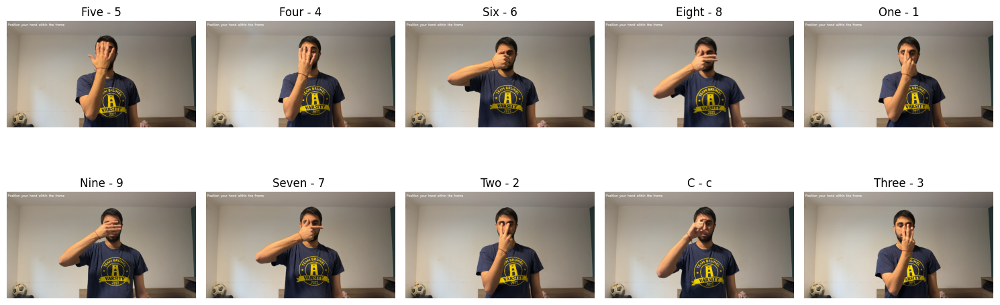

In [3]:
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import seaborn as sns

# Define paths
path1 = '/kaggle/input/bsl-dataset-credits-to-eren-tatepe/1_HAND_DATASET/1_HAND_DATASET'
path2 = '/kaggle/input/bsl-dataset-credits-to-eren-tatepe/2_HAND_DATASET/2_HAND_DATASET'

def get_data_info(paths):
    data = []
    for base in paths:
        if not os.path.exists(base):
            continue
        for root, _, files in os.walk(base):
            for file in files:
                if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                    label = os.path.basename(root)
                    data.append({'path': os.path.join(root, file), 'label': label})
    return pd.DataFrame(data)

# Create dataframe
df = get_data_info([path1, path2])

# Print counts
print(f"Total images found: {len(df)}")
print("\nClass distribution:")
print(df['label'].value_counts())

# Visualize 10 random samples
def show_samples(df):
    plt.figure(figsize=(15, 6))
    unique_labels = df['label'].unique()
    indices = [df[df['label'] == label].index[0] for label in unique_labels[:10]]
    
    for i, idx in enumerate(indices):
        path = df.iloc[idx]['path']
        label = df.iloc[idx]['label']
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        plt.subplot(2, 5, i + 1)
        plt.imshow(img)
        plt.title(label)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

show_samples(df)

In [9]:
import os
import cv2
import numpy as np
import urllib.request
from tqdm import tqdm
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
import matplotlib.pyplot as plt

# Download model
model_path = '/kaggle/working/hand_landmarker.task'
if not os.path.exists(model_path):
    print("Downloading hand landmarker model...")
    urllib.request.urlretrieve(
        'https://storage.googleapis.com/mediapipe-models/hand_landmarker/hand_landmarker/float16/1/hand_landmarker.task',
        model_path
    )
print("Model ready.")

2026-02-19 19:42:18.634858: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1771530138.855584      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1771530138.916274      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1771530139.431745      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1771530139.431783      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1771530139.431786      55 computation_placer.cc:177] computation placer alr

Model ready.


In [10]:
base_options = python.BaseOptions(model_asset_path=model_path)
options = vision.HandLandmarkerOptions(
    base_options=base_options,
    num_hands=1,
    min_hand_detection_confidence=0.5,
    running_mode=vision.RunningMode.IMAGE
)
detector = vision.HandLandmarker.create_from_options(options)
print("MediaPipe initialized.")

MediaPipe initialized.


INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
W0000 00:00:1771530162.672217     175 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1771530162.692245     175 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


In [11]:
path1 = '/kaggle/input/bsl-dataset-credits-to-eren-tatepe/1_HAND_DATASET/1_HAND_DATASET'
path2 = '/kaggle/input/bsl-dataset-credits-to-eren-tatepe/2_HAND_DATASET/2_HAND_DATASET'

output_path    = '/kaggle/working/bsl_cropped'
output_clahe   = '/kaggle/working/bsl_cropped_clahe'

os.makedirs(output_path,  exist_ok=True)
os.makedirs(output_clahe, exist_ok=True)

paths = [path1, path2]
classes = []
for path in paths:
    classes.extend([d for d in os.listdir(path) if os.path.isdir(os.path.join(path, d))])
classes = sorted(set(classes))
print(f"Total classes: {len(classes)}")
print(f"Classes: {classes}")

Total classes: 34
Classes: ['A - a', 'B - b', 'C - c', 'D - d', 'E - e', 'Eight - 8', 'F - f', 'Five - 5', 'Four - 4', 'G - g', 'I - i', 'K - k', 'L - l', 'M - m', 'N - n', 'Nine - 9', 'O - o', 'One - 1', 'P - p', 'Q - q', 'R - r', 'S - s', 'Seven - 7 ', 'Six - 6', 'T - t', 'Ten - 10', 'Three - 3', 'Two - 2', 'U - u', 'V - v', 'W - w', 'X - x', 'Z - z', 'Zero - 0']


In [12]:
def get_bounding_box(landmarks, image_shape, padding=0.2):
    h, w, _ = image_shape
    x_coords = [lm.x for lm in landmarks]
    y_coords = [lm.y for lm in landmarks]
    x_min_px = int(min(x_coords) * w)
    x_max_px = int(max(x_coords) * w)
    y_min_px = int(min(y_coords) * h)
    y_max_px = int(max(y_coords) * h)
    pad_x = int((x_max_px - x_min_px) * padding)
    pad_y = int((y_max_px - y_min_px) * padding)
    return (max(0, x_min_px - pad_x), max(0, y_min_px - pad_y),
            min(w, x_max_px + pad_x), min(h, y_max_px + pad_y))

def apply_clahe(image_bgr):
    lab = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l_enhanced = clahe.apply(l)
    lab_enhanced = cv2.merge([l_enhanced, a, b])
    enhanced = cv2.cvtColor(lab_enhanced, cv2.COLOR_LAB2BGR)
    enhanced = cv2.GaussianBlur(enhanced, (3, 3), 0)
    return enhanced

print("Functions defined.")

Functions defined.


In [13]:
def get_already_processed(output_dir, classes):
    """Returns a set of (cls, img_stem) already saved."""
    done = set()
    for cls in classes:
        cls_dir = os.path.join(output_dir, cls)
        if not os.path.exists(cls_dir):
            continue
        for f in os.listdir(cls_dir):
            done.add((cls, os.path.splitext(f)[0]))
    return done

already_done = get_already_processed(output_path, classes)
print(f"Already processed: {len(already_done)} images — will skip these.")

Already processed: 0 images — will skip these.


In [14]:
total_images    = 0
no_hand_detected = 0

for path in paths:
    for cls in classes:
        cls_input  = os.path.join(path, cls)
        cls_output = os.path.join(output_path, cls)
        if not os.path.exists(cls_input):
            continue
        os.makedirs(cls_output, exist_ok=True)

        images = [f for f in os.listdir(cls_input) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

        for img_name in tqdm(images, desc=f"[Crop] {cls}"):
            stem = os.path.splitext(img_name)[0]

            # ── SKIP if already done ──────────────────────────────────────
            if (cls, stem) in already_done:
                continue

            img_path = os.path.join(cls_input, img_name)
            image = cv2.imread(img_path)
            if image is None:
                continue

            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            mp_image  = mp.Image(image_format=mp.ImageFormat.SRGB, data=image_rgb)
            results   = detector.detect(mp_image)

            if results.hand_landmarks:
                landmarks = results.hand_landmarks[0]
                x1, y1, x2, y2 = get_bounding_box(landmarks, image.shape)
                cropped = image[y1:y2, x1:x2]
                if cropped.size == 0:
                    no_hand_detected += 1
                    continue
                resized  = cv2.resize(cropped, (224, 224))
                out_path = os.path.join(cls_output, stem + '.jpg')
                cv2.imwrite(out_path, resized)
            else:
                no_hand_detected += 1

            total_images += 1

print(f"\nStep 1 Complete!")
print(f"Processed this run : {total_images}")
print(f"No hand detected   : {no_hand_detected}")

[Crop] Z - z: 100%|██████████| 1000/1000 [01:18<00:00, 12.76it/s]


Step 1 Complete!
Processed this run : 34000
No hand detected   : 79


In [15]:
already_clahe = get_already_processed(output_clahe, classes)
print(f"Already CLAHE'd: {len(already_clahe)} images — will skip these.")

clahe_total = 0

for cls in classes:
    cls_input  = os.path.join(output_path, cls)
    cls_output = os.path.join(output_clahe, cls)
    if not os.path.exists(cls_input):
        continue
    os.makedirs(cls_output, exist_ok=True)

    images = [f for f in os.listdir(cls_input) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]

    for img_name in tqdm(images, desc=f"[CLAHE] {cls}"):
        stem = os.path.splitext(img_name)[0]

        # ── SKIP if already done ──────────────────────────────────────────
        if (cls, stem) in already_clahe:
            continue

        img = cv2.imread(os.path.join(cls_input, img_name))
        if img is None:
            continue
        enhanced = apply_clahe(img)
        cv2.imwrite(os.path.join(cls_output, img_name), enhanced)
        clahe_total += 1

print(f"\nStep 2 Complete!")
print(f"CLAHE applied this run: {clahe_total}")

Already CLAHE'd: 0 images — will skip these.


[CLAHE] Zero - 0: 100%|██████████| 963/963 [00:03<00:00, 310.23it/s]


Step 2 Complete!
CLAHE applied this run: 33921


=== Final Dataset Summary ===
  A - a: 1000 images
  B - b: 1000 images
  C - c: 998 images
  D - d: 1000 images
  E - e: 1000 images
  Eight - 8: 1000 images
  F - f: 997 images
  Five - 5: 1000 images
  Four - 4: 999 images
  G - g: 998 images
  I - i: 1000 images
  K - k: 1000 images
  L - l: 1000 images
  M - m: 996 images
  N - n: 1000 images
  Nine - 9: 1000 images
  O - o: 1000 images
  One - 1: 997 images
  P - p: 1000 images
  Q - q: 1000 images
  R - r: 998 images
  S - s: 999 images
  Seven - 7 : 1000 images
  Six - 6: 1000 images
  T - t: 998 images
  Ten - 10: 1000 images
  Three - 3: 1000 images
  Two - 2: 1000 images
  U - u: 988 images
  V - v: 995 images
  W - w: 995 images
  X - x: 1000 images
  Z - z: 1000 images
  Zero - 0: 963 images

Total: 33921 images across 34 classes


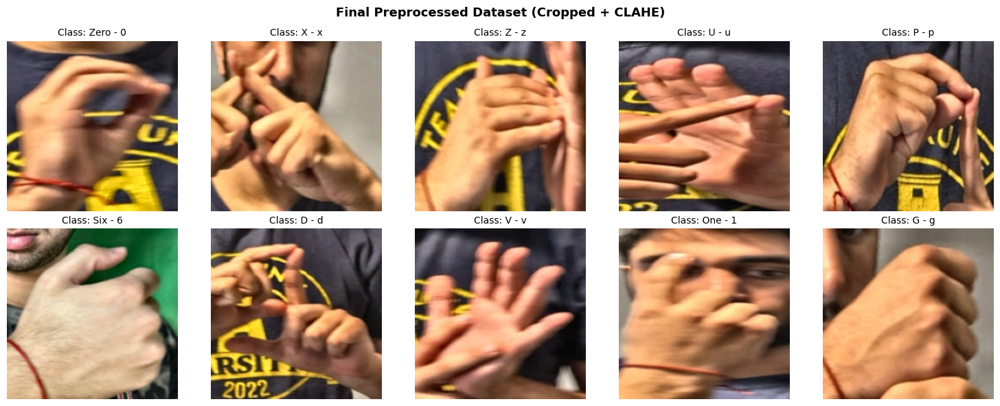

In [16]:
# Count final dataset
print("=== Final Dataset Summary ===")
total = 0
for cls in classes:
    cls_dir = os.path.join(output_clahe, cls)
    if os.path.exists(cls_dir):
        count = len(os.listdir(cls_dir))
        total += count
        print(f"  {cls}: {count} images")
print(f"\nTotal: {total} images across {len(classes)} classes")

# Visualize samples
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes = axes.ravel()
sample_classes = np.random.choice(classes, size=min(10, len(classes)), replace=False)

for i, cls in enumerate(sample_classes):
    cls_path = os.path.join(output_clahe, cls)
    imgs = [f for f in os.listdir(cls_path) if f.endswith('.jpg')]
    if not imgs:
        continue
    img = cv2.imread(os.path.join(cls_path, np.random.choice(imgs)))
    axes[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[i].set_title(f'Class: {cls}', fontsize=10)
    axes[i].axis('off')

plt.suptitle('Final Preprocessed Dataset (Cropped + CLAHE)', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

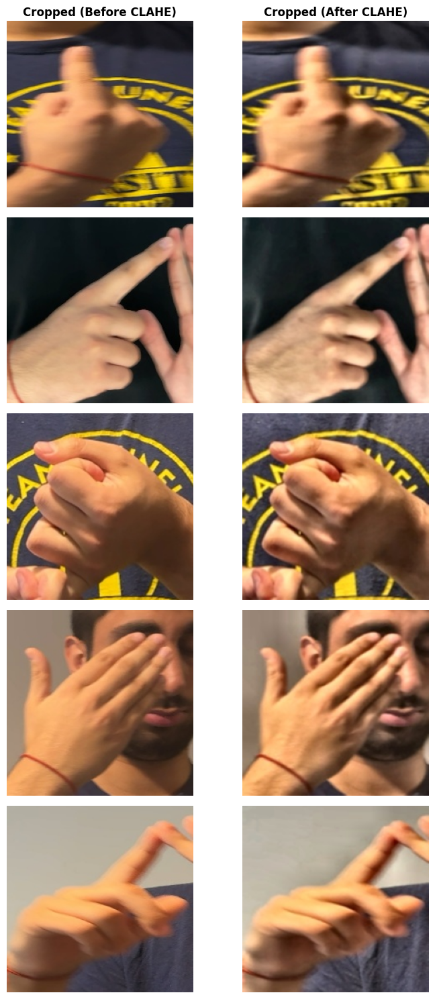

In [17]:
sample_classes_vis = np.random.choice(classes, size=min(5, len(classes)), replace=False)
fig, axes = plt.subplots(len(sample_classes_vis), 2, figsize=(8, len(sample_classes_vis) * 3))
axes[0, 0].set_title('Cropped (Before CLAHE)', fontweight='bold')
axes[0, 1].set_title('Cropped (After CLAHE)',  fontweight='bold')

for i, cls in enumerate(sample_classes_vis):
    imgs = os.listdir(os.path.join(output_path, cls))
    img_name = np.random.choice(imgs)

    orig = cv2.imread(os.path.join(output_path,  cls, img_name))
    enh  = cv2.imread(os.path.join(output_clahe, cls, img_name))

    axes[i, 0].imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB))
    axes[i, 1].imshow(cv2.cvtColor(enh,  cv2.COLOR_BGR2RGB))
    axes[i, 0].set_ylabel(cls, fontsize=11, fontweight='bold')
    axes[i, 0].axis('off')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

In [18]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator

print("TensorFlow version:", tf.__version__)
print("GPU available:", tf.config.list_physical_devices('GPU'))

TensorFlow version: 2.19.0
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


Total images : 33921
Total classes: 34
Avg per class: 997
Min class    : Zero - 0 → 963
Max class    : A - a → 1000


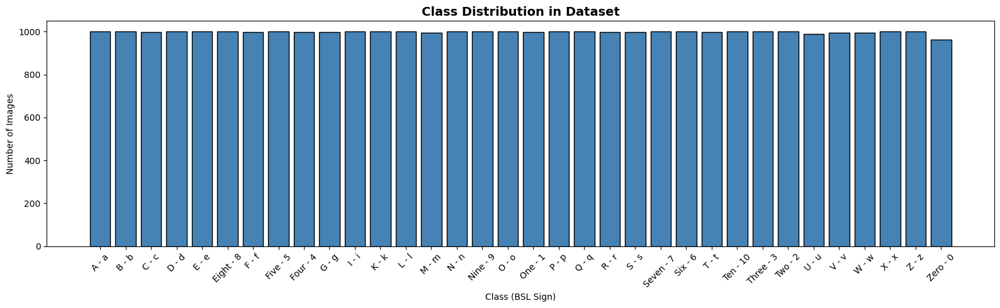

In [19]:
data_path = '/kaggle/working/bsl_cropped_clahe'
classes = sorted(os.listdir(data_path))

class_counts = {}
for cls in classes:
    cls_dir = os.path.join(data_path, cls)
    class_counts[cls] = len([f for f in os.listdir(cls_dir) if f.endswith('.jpg')])

total = sum(class_counts.values())
print(f"Total images : {total}")
print(f"Total classes: {len(classes)}")
print(f"Avg per class: {total // len(classes)}")
print(f"Min class    : {min(class_counts, key=class_counts.get)} → {min(class_counts.values())}")
print(f"Max class    : {max(class_counts, key=class_counts.get)} → {max(class_counts.values())}")

# Bar chart
plt.figure(figsize=(16, 5))
plt.bar(class_counts.keys(), class_counts.values(), color='steelblue', edgecolor='black')
plt.title('Class Distribution in Dataset', fontsize=14, fontweight='bold')
plt.xlabel('Class (BSL Sign)')
plt.ylabel('Number of Images')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [20]:
IMG_SIZE   = 224
BATCH_SIZE = 32

# No augmentation — just rescaling
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2   # 80% train, 20% for val+test
)

train_gen = datagen.flow_from_directory(
    data_path,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True,
    seed=42
)

val_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

# Split the 20% into val and test using two generators with different seeds
val_gen = val_datagen.flow_from_directory(
    data_path,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=False,
    seed=42
)

print(f"\nClass indices: {train_gen.class_indices}")
print(f"Train batches : {len(train_gen)}")
print(f"Val batches   : {len(val_gen)}")
NUM_CLASSES = len(classes)

Found 27143 images belonging to 34 classes.
Found 6778 images belonging to 34 classes.

Class indices: {'A - a': 0, 'B - b': 1, 'C - c': 2, 'D - d': 3, 'E - e': 4, 'Eight - 8': 5, 'F - f': 6, 'Five - 5': 7, 'Four - 4': 8, 'G - g': 9, 'I - i': 10, 'K - k': 11, 'L - l': 12, 'M - m': 13, 'N - n': 14, 'Nine - 9': 15, 'O - o': 16, 'One - 1': 17, 'P - p': 18, 'Q - q': 19, 'R - r': 20, 'S - s': 21, 'Seven - 7 ': 22, 'Six - 6': 23, 'T - t': 24, 'Ten - 10': 25, 'Three - 3': 26, 'Two - 2': 27, 'U - u': 28, 'V - v': 29, 'W - w': 30, 'X - x': 31, 'Z - z': 32, 'Zero - 0': 33}
Train batches : 849
Val batches   : 212


In [21]:
def build_model(num_classes):
    base_model = MobileNetV2(
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
        include_top=False,
        weights='imagenet'
    )
    # Freeze base model initially
    base_model.trainable = False

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = BatchNormalization()(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.4)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.3)(x)
    output = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=output)
    return model, base_model

model, base_model = build_model(NUM_CLASSES)

model.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

I0000 00:00:1771532955.517516      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13757 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1771532955.525775      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13757 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,628,322 (10.03 MB)

 Trainable params: 367,778 (1.40 MB)

 Non-trainable params: 2,260,544 (8.62 MB)

In [22]:
callbacks = [
    EarlyStopping(
        monitor='val_accuracy',
        patience=5,
        restore_best_weights=True,
        verbose=1
    ),
    ModelCheckpoint(
        '/kaggle/working/mobilenetv2_bsl_phase1.h5',
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-7,
        verbose=1
    )
]
print("Callbacks ready.")

Callbacks ready.


In [23]:
print("=== Phase 1: Training top layers with frozen base ===")

history1 = model.fit(
    train_gen,
    epochs=10,
    validation_data=val_gen,
    callbacks=callbacks,
    verbose=1
)

=== Phase 1: Training top layers with frozen base ===
Epoch 1/10


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1771532963.788569     215 service.cc:152] XLA service 0x784814114380 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1771532963.788610     215 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1771532963.788613     215 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1771532964.958733     215 cuda_dnn.cc:529] Loaded cuDNN version 91002
2026-02-19 20:29:33.186128: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal

434/849 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - accuracy: 0.4176 - loss: 2.1939

2026-02-19 20:29:59.542548: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 20:29:59.679518: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.5372 - loss: 1.6978

2026-02-19 20:30:36.236810: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 20:30:36.379730: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 20:30:36.515871: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.



Epoch 1: val_accuracy improved from -inf to 0.69947, saving model to /kaggle/working/mobilenetv2_bsl_phase1.h5


849/849 ━━━━━━━━━━━━━━━━━━━━ 81s 73ms/step - accuracy: 0.5376 - loss: 1.6962 - val_accuracy: 0.6995 - val_loss: 0.9545 - learning_rate: 0.0010
Epoch 2/10
849/849 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.8773 - loss: 0.3885
Epoch 2: val_accuracy improved from 0.69947 to 0.76114, saving model to /kaggle/working/mobilenetv2_bsl_phase1.h5


849/849 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - accuracy: 0.8773 - loss: 0.3885 - val_accuracy: 0.7611 - val_loss: 0.7556 - learning_rate: 0.0010
Epoch 3/10
848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.9116 - loss: 0.2733
Epoch 3: val_accuracy improved from 0.76114 to 0.78991, saving model to /kaggle/working/mobilenetv2_bsl_phase1.h5


849/849 ━━━━━━━━━━━━━━━━━━━━ 37s 44ms/step - accuracy: 0.9116 - loss: 0.2733 - val_accuracy: 0.7899 - val_loss: 0.7029 - learning_rate: 0.0010
Epoch 4/10
848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.9272 - loss: 0.2265
Epoch 4: val_accuracy improved from 0.78991 to 0.79374, saving model to /kaggle/working/mobilenetv2_bsl_phase1.h5


849/849 ━━━━━━━━━━━━━━━━━━━━ 37s 44ms/step - accuracy: 0.9272 - loss: 0.2265 - val_accuracy: 0.7937 - val_loss: 0.6736 - learning_rate: 0.0010
Epoch 5/10
848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.9432 - loss: 0.1779
Epoch 5: val_accuracy improved from 0.79374 to 0.79935, saving model to /kaggle/working/mobilenetv2_bsl_phase1.h5


849/849 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - accuracy: 0.9432 - loss: 0.1779 - val_accuracy: 0.7994 - val_loss: 0.6769 - learning_rate: 0.0010
Epoch 6/10
848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.9461 - loss: 0.1696
Epoch 6: val_accuracy improved from 0.79935 to 0.80761, saving model to /kaggle/working/mobilenetv2_bsl_phase1.h5


849/849 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - accuracy: 0.9461 - loss: 0.1696 - val_accuracy: 0.8076 - val_loss: 0.6662 - learning_rate: 0.0010
Epoch 7/10
849/849 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.9522 - loss: 0.1470
Epoch 7: val_accuracy did not improve from 0.80761
849/849 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step - accuracy: 0.9522 - loss: 0.1470 - val_accuracy: 0.8054 - val_loss: 0.6932 - learning_rate: 0.0010
Epoch 8/10
849/849 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.9579 - loss: 0.1323
Epoch 8: val_accuracy improved from 0.80761 to 0.82871, saving model to /kaggle/working/mobilenetv2_bsl_phase1.h5


849/849 ━━━━━━━━━━━━━━━━━━━━ 36s 43ms/step - accuracy: 0.9579 - loss: 0.1323 - val_accuracy: 0.8287 - val_loss: 0.6088 - learning_rate: 0.0010
Epoch 9/10
848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.9588 - loss: 0.1329
Epoch 9: val_accuracy did not improve from 0.82871
849/849 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - accuracy: 0.9588 - loss: 0.1329 - val_accuracy: 0.8266 - val_loss: 0.6547 - learning_rate: 0.0010
Epoch 10/10
848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.9618 - loss: 0.1170
Epoch 10: val_accuracy did not improve from 0.82871
849/849 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step - accuracy: 0.9618 - loss: 0.1170 - val_accuracy: 0.8228 - val_loss: 0.6962 - learning_rate: 0.0010
Restoring model weights from the end of the best epoch: 8.


In [24]:
print("=== Phase 2: Fine-tuning last 30 layers ===")

# Unfreeze last 30 layers of base model
base_model.trainable = True
for layer in base_model.layers[:-30]:
    layer.trainable = False

# Recompile with lower learning rate
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

callbacks_ft = [
    EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True, verbose=1),
    ModelCheckpoint('/kaggle/working/mobilenetv2_bsl_final.h5', monitor='val_accuracy', save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7, verbose=1)
]

history2 = model.fit(
    train_gen,
    epochs=20,
    validation_data=val_gen,
    callbacks=callbacks_ft,
    verbose=1
)

=== Phase 2: Fine-tuning last 30 layers ===
Epoch 1/20
848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.8601 - loss: 0.5311
Epoch 1: val_accuracy improved from -inf to 0.81720, saving model to /kaggle/working/mobilenetv2_bsl_final.h5


849/849 ━━━━━━━━━━━━━━━━━━━━ 70s 63ms/step - accuracy: 0.8602 - loss: 0.5306 - val_accuracy: 0.8172 - val_loss: 0.8344 - learning_rate: 1.0000e-04
Epoch 2/20
848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9670 - loss: 0.1023
Epoch 2: val_accuracy improved from 0.81720 to 0.89731, saving model to /kaggle/working/mobilenetv2_bsl_final.h5


849/849 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - accuracy: 0.9670 - loss: 0.1023 - val_accuracy: 0.8973 - val_loss: 0.3653 - learning_rate: 1.0000e-04
Epoch 3/20
848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9825 - loss: 0.0541
Epoch 3: val_accuracy improved from 0.89731 to 0.89997, saving model to /kaggle/working/mobilenetv2_bsl_final.h5


849/849 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - accuracy: 0.9825 - loss: 0.0541 - val_accuracy: 0.9000 - val_loss: 0.3977 - learning_rate: 1.0000e-04
Epoch 4/20
848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 0.9898 - loss: 0.0363
Epoch 4: val_accuracy improved from 0.89997 to 0.90986, saving model to /kaggle/working/mobilenetv2_bsl_final.h5


849/849 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step - accuracy: 0.9898 - loss: 0.0363 - val_accuracy: 0.9099 - val_loss: 0.3396 - learning_rate: 1.0000e-04
Epoch 5/20
849/849 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9895 - loss: 0.0332
Epoch 5: val_accuracy did not improve from 0.90986
849/849 ━━━━━━━━━━━━━━━━━━━━ 39s 45ms/step - accuracy: 0.9895 - loss: 0.0332 - val_accuracy: 0.9004 - val_loss: 0.4218 - learning_rate: 1.0000e-04
Epoch 6/20
849/849 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9886 - loss: 0.0403
Epoch 6: val_accuracy did not improve from 0.90986
849/849 ━━━━━━━━━━━━━━━━━━━━ 38s 45ms/step - accuracy: 0.9886 - loss: 0.0403 - val_accuracy: 0.9026 - val_loss: 0.3834 - learning_rate: 1.0000e-04
Epoch 7/20
849/849 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9913 - loss: 0.0305
Epoch 7: val_accuracy improved from 0.90986 to 0.92092, saving model to /kaggle/working/mobilenetv2_bsl_final.h5


849/849 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - accuracy: 0.9913 - loss: 0.0305 - val_accuracy: 0.9209 - val_loss: 0.3288 - learning_rate: 1.0000e-04
Epoch 8/20
848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9932 - loss: 0.0243
Epoch 8: val_accuracy did not improve from 0.92092
849/849 ━━━━━━━━━━━━━━━━━━━━ 39s 45ms/step - accuracy: 0.9932 - loss: 0.0243 - val_accuracy: 0.9137 - val_loss: 0.3525 - learning_rate: 1.0000e-04
Epoch 9/20
848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9935 - loss: 0.0230
Epoch 9: val_accuracy did not improve from 0.92092
849/849 ━━━━━━━━━━━━━━━━━━━━ 39s 45ms/step - accuracy: 0.9935 - loss: 0.0230 - val_accuracy: 0.9205 - val_loss: 0.3711 - learning_rate: 1.0000e-04
Epoch 10/20
848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 0.9935 - loss: 0.0200
Epoch 10: val_accuracy improved from 0.92092 to 0.92284, saving model to /kaggle/working/mobilenetv2_bsl_final.h5



Epoch 10: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
849/849 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step - accuracy: 0.9935 - loss: 0.0200 - val_accuracy: 0.9228 - val_loss: 0.3442 - learning_rate: 1.0000e-04
Epoch 11/20
848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9969 - loss: 0.0123
Epoch 11: val_accuracy improved from 0.92284 to 0.93597, saving model to /kaggle/working/mobilenetv2_bsl_final.h5


849/849 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - accuracy: 0.9969 - loss: 0.0123 - val_accuracy: 0.9360 - val_loss: 0.2837 - learning_rate: 5.0000e-05
Epoch 12/20
849/849 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9979 - loss: 0.0065
Epoch 12: val_accuracy improved from 0.93597 to 0.94482, saving model to /kaggle/working/mobilenetv2_bsl_final.h5


849/849 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.9448 - val_loss: 0.2205 - learning_rate: 5.0000e-05
Epoch 13/20
848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9987 - loss: 0.0050
Epoch 13: val_accuracy improved from 0.94482 to 0.95205, saving model to /kaggle/working/mobilenetv2_bsl_final.h5


849/849 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - accuracy: 0.9987 - loss: 0.0050 - val_accuracy: 0.9521 - val_loss: 0.1905 - learning_rate: 5.0000e-05
Epoch 14/20
849/849 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9985 - loss: 0.0070
Epoch 14: val_accuracy did not improve from 0.95205
849/849 ━━━━━━━━━━━━━━━━━━━━ 39s 45ms/step - accuracy: 0.9985 - loss: 0.0070 - val_accuracy: 0.9438 - val_loss: 0.2142 - learning_rate: 5.0000e-05
Epoch 15/20
848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9984 - loss: 0.0051
Epoch 15: val_accuracy improved from 0.95205 to 0.95382, saving model to /kaggle/working/mobilenetv2_bsl_final.h5


849/849 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - accuracy: 0.9984 - loss: 0.0051 - val_accuracy: 0.9538 - val_loss: 0.1653 - learning_rate: 5.0000e-05
Epoch 16/20
849/849 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9986 - loss: 0.0058
Epoch 16: val_accuracy did not improve from 0.95382
849/849 ━━━━━━━━━━━━━━━━━━━━ 38s 45ms/step - accuracy: 0.9986 - loss: 0.0058 - val_accuracy: 0.9482 - val_loss: 0.2075 - learning_rate: 5.0000e-05
Epoch 17/20
848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9981 - loss: 0.0067
Epoch 17: val_accuracy did not improve from 0.95382
849/849 ━━━━━━━━━━━━━━━━━━━━ 38s 45ms/step - accuracy: 0.9981 - loss: 0.0067 - val_accuracy: 0.9299 - val_loss: 0.3589 - learning_rate: 5.0000e-05
Epoch 18/20
848/849 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9988 - loss: 0.0042
Epoch 18: val_accuracy improved from 0.95382 to 0.95736, saving model to /kaggle/working/mobilenetv2_bsl_final.h5


849/849 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - accuracy: 0.9988 - loss: 0.0042 - val_accuracy: 0.9574 - val_loss: 0.1592 - learning_rate: 5.0000e-05
Epoch 19/20
849/849 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9988 - loss: 0.0042
Epoch 19: val_accuracy did not improve from 0.95736
849/849 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - accuracy: 0.9988 - loss: 0.0042 - val_accuracy: 0.9484 - val_loss: 0.2122 - learning_rate: 5.0000e-05
Epoch 20/20
849/849 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9985 - loss: 0.0057
Epoch 20: val_accuracy did not improve from 0.95736
849/849 ━━━━━━━━━━━━━━━━━━━━ 38s 45ms/step - accuracy: 0.9985 - loss: 0.0057 - val_accuracy: 0.9500 - val_loss: 0.2091 - learning_rate: 5.0000e-05
Restoring model weights from the end of the best epoch: 18.


In [25]:
# Get predictions
val_gen.reset()
y_pred_probs = model.predict(val_gen, verbose=1)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = val_gen.classes

# Classification Report
print("\n=== Classification Report ===")
print(classification_report(y_true, y_pred, target_names=classes))

# Overall metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

print("=== Overall Metrics ===")
print(f"Accuracy : {accuracy_score(y_true, y_pred):.4f}")
print(f"Precision: {precision_score(y_true, y_pred, average='weighted'):.4f}")
print(f"Recall   : {recall_score(y_true, y_pred, average='weighted'):.4f}")
print(f"F1-Score : {f1_score(y_true, y_pred, average='weighted'):.4f}")

212/212 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step

=== Classification Report ===
              precision    recall  f1-score   support

       A - a       0.98      0.85      0.91       200
       B - b       1.00      0.99      0.99       200
       C - c       0.98      0.95      0.97       199
       D - d       0.99      0.99      0.99       200
       E - e       0.82      0.69      0.75       200
   Eight - 8       0.99      0.98      0.99       200
       F - f       1.00      1.00      1.00       199
    Five - 5       0.99      1.00      1.00       200
    Four - 4       0.98      0.94      0.96       199
       G - g       0.99      1.00      0.99       199
       I - i       0.85      0.81      0.83       200
       K - k       0.99      0.99      0.99       200
       L - l       0.98      0.99      0.99       200
       M - m       0.95      0.97      0.96       199
       N - n       0.95      0.93      0.94       200
    Nine - 9       0.99      1.00      1.00       200
       

In [26]:
import json

class_indices = train_gen.class_indices
idx_to_class  = {v: k for k, v in class_indices.items()}

with open('/kaggle/working/class_indices.json', 'w') as f:
    json.dump(idx_to_class, f)

print("Model saved   : /kaggle/working/mobilenetv2_bsl_final.h5")
print("Classes saved : /kaggle/working/class_indices.json")
print("Ready for Gradio deployment!")

Model saved   : /kaggle/working/mobilenetv2_bsl_final.h5
Classes saved : /kaggle/working/class_indices.json
Ready for Gradio deployment!


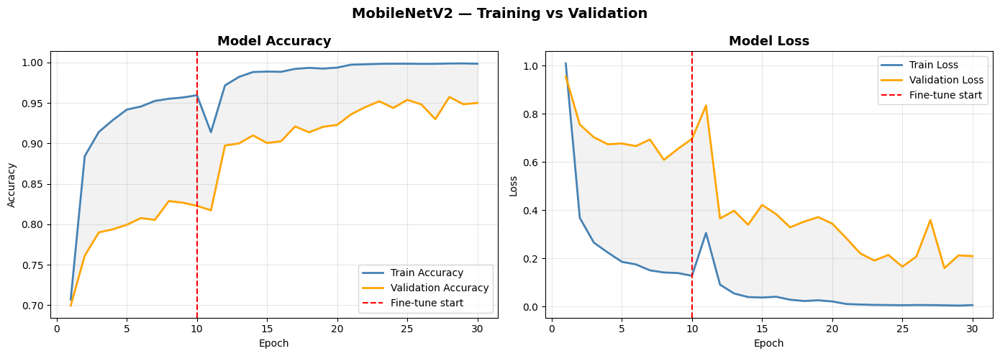

Saved: training_curves.png


In [27]:
import matplotlib.pyplot as plt
import numpy as np

def plot_history(h1, h2):
    acc      = h1.history['accuracy']     + h2.history['accuracy']
    val_acc  = h1.history['val_accuracy'] + h2.history['val_accuracy']
    loss     = h1.history['loss']         + h2.history['loss']
    val_loss = h1.history['val_loss']     + h2.history['val_loss']
    epochs   = range(1, len(acc) + 1)
    phase2_start = len(h1.history['accuracy'])

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Accuracy
    axes[0].plot(epochs, acc,     label='Train Accuracy',      color='steelblue',  linewidth=2)
    axes[0].plot(epochs, val_acc, label='Validation Accuracy', color='orange',     linewidth=2)
    axes[0].axvline(x=phase2_start, color='red', linestyle='--', linewidth=1.5, label='Fine-tune start')
    axes[0].fill_between(epochs, acc, val_acc, alpha=0.1, color='gray')
    axes[0].set_title('Model Accuracy', fontweight='bold', fontsize=13)
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Accuracy')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # Loss
    axes[1].plot(epochs, loss,     label='Train Loss',      color='steelblue',  linewidth=2)
    axes[1].plot(epochs, val_loss, label='Validation Loss', color='orange',     linewidth=2)
    axes[1].axvline(x=phase2_start, color='red', linestyle='--', linewidth=1.5, label='Fine-tune start')
    axes[1].fill_between(epochs, loss, val_loss, alpha=0.1, color='gray')
    axes[1].set_title('Model Loss', fontweight='bold', fontsize=13)
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.suptitle('MobileNetV2 — Training vs Validation', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig('/kaggle/working/training_curves.png', dpi=150, bbox_inches='tight')
    plt.show()
    print("Saved: training_curves.png")

plot_history(history1, history2)

212/212 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step


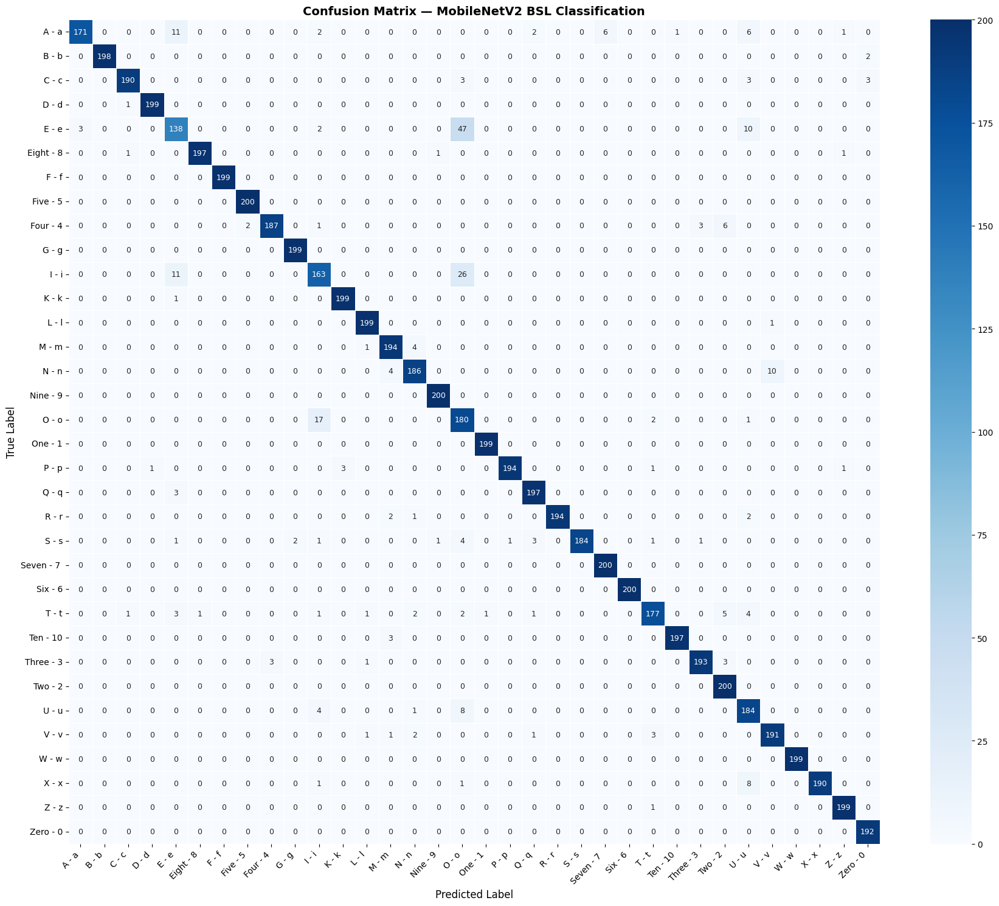

Saved: confusion_matrix.png


In [28]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Get predictions
val_gen.reset()
y_pred_probs = model.predict(val_gen, verbose=1)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = val_gen.classes

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(18, 15))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=classes,
    yticklabels=classes,
    linewidths=0.5,
    annot_kws={"size": 9}
)
plt.title('Confusion Matrix — MobileNetV2 BSL Classification', fontsize=14, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig('/kaggle/working/confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: confusion_matrix.png")

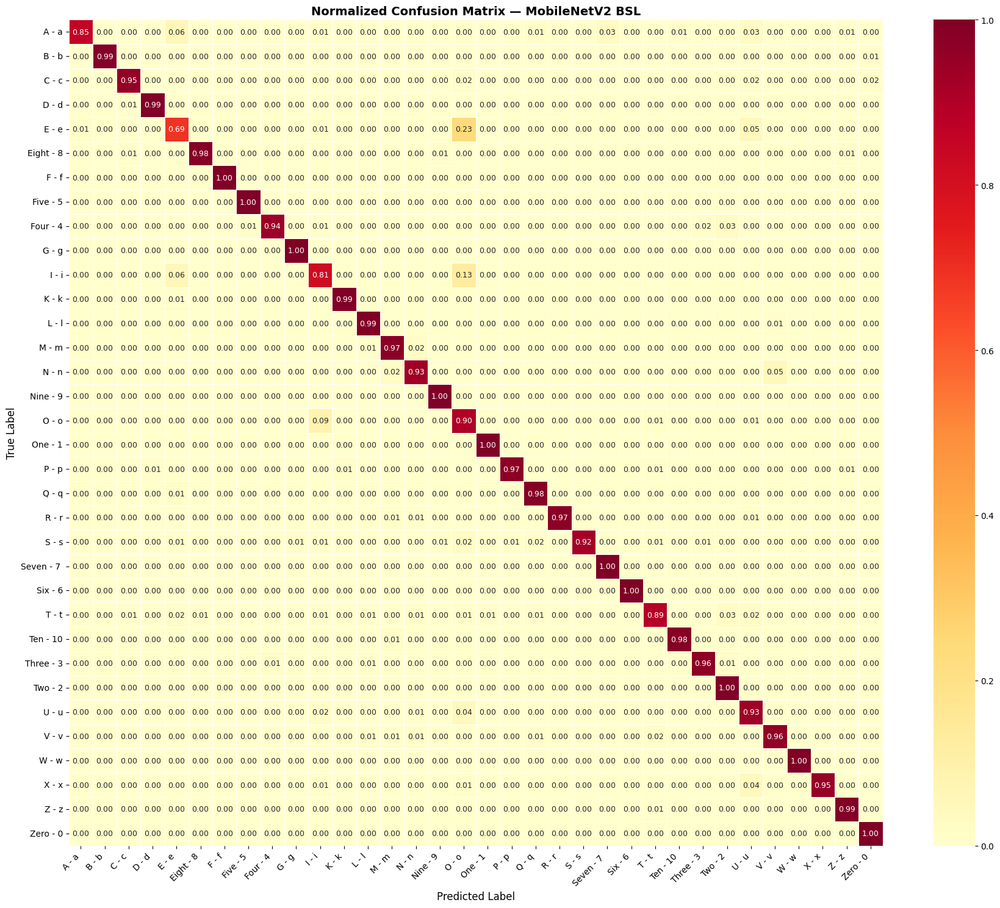

Saved: confusion_matrix_normalized.png


In [29]:
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

plt.figure(figsize=(18, 15))
sns.heatmap(
    cm_norm,
    annot=True,
    fmt='.2f',
    cmap='YlOrRd',
    xticklabels=classes,
    yticklabels=classes,
    linewidths=0.5,
    annot_kws={"size": 9},
    vmin=0, vmax=1
)
plt.title('Normalized Confusion Matrix — MobileNetV2 BSL', fontsize=14, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig('/kaggle/working/confusion_matrix_normalized.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: confusion_matrix_normalized.png")

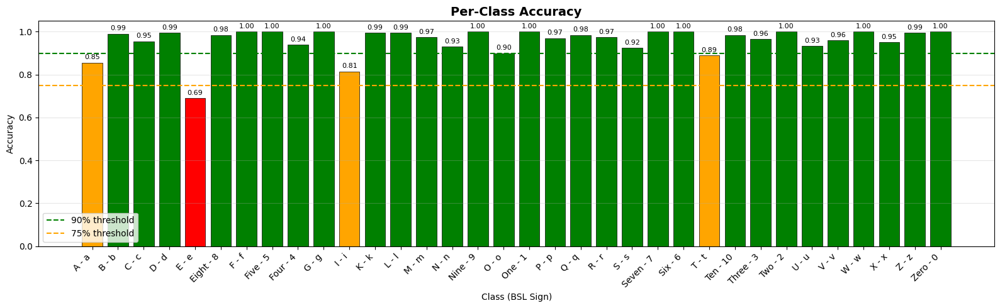

Saved: per_class_accuracy.png


In [30]:
per_class_acc = cm.diagonal() / cm.sum(axis=1)

colors = ['green' if acc >= 0.90 else 'orange' if acc >= 0.75 else 'red' for acc in per_class_acc]

plt.figure(figsize=(16, 5))
bars = plt.bar(classes, per_class_acc, color=colors, edgecolor='black', linewidth=0.5)
plt.axhline(y=0.90, color='green',  linestyle='--', linewidth=1.5, label='90% threshold')
plt.axhline(y=0.75, color='orange', linestyle='--', linewidth=1.5, label='75% threshold')
plt.title('Per-Class Accuracy', fontsize=14, fontweight='bold')
plt.xlabel('Class (BSL Sign)')
plt.ylabel('Accuracy')
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1.05)
plt.legend()
plt.grid(True, alpha=0.3, axis='y')

# Add value labels on bars
for bar, acc in zip(bars, per_class_acc):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
             f'{acc:.2f}', ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.savefig('/kaggle/working/per_class_accuracy.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: per_class_accuracy.png")

/tmp/ipykernel_55/3298662228.py:46: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_55/3298662228.py:47: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(f'/kaggle/working/{filename}', dpi=150, bbox_inches='tight')
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


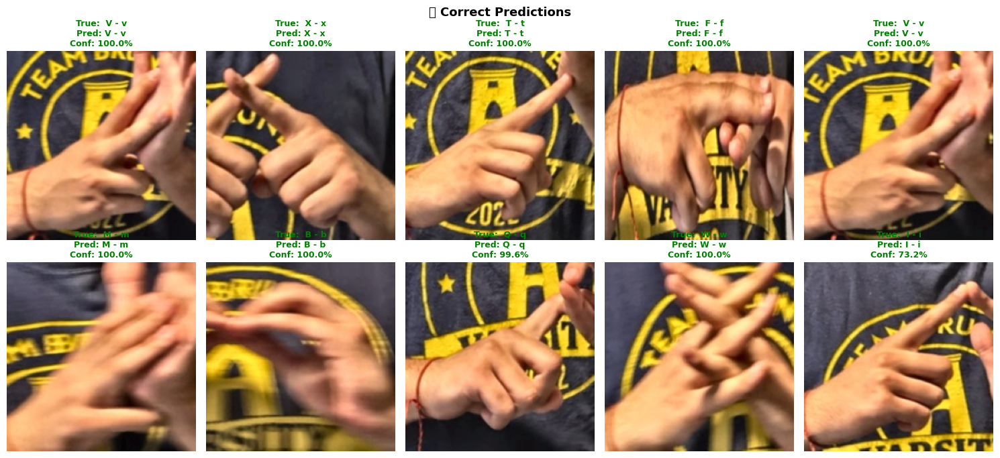

Saved: correct_predictions.png


/tmp/ipykernel_55/3298662228.py:46: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_55/3298662228.py:47: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(f'/kaggle/working/{filename}', dpi=150, bbox_inches='tight')
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


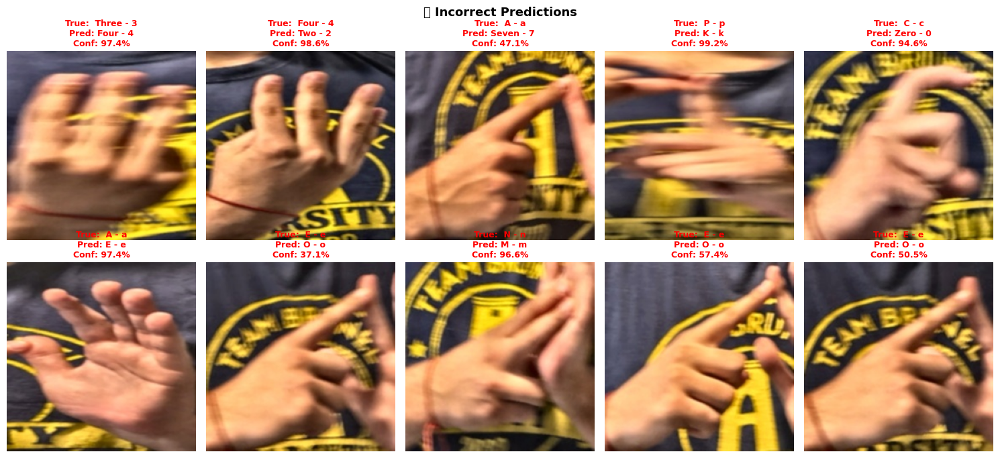

Saved: incorrect_predictions.png


In [31]:
import cv2

# Get all file paths and true labels from val_gen
val_gen.reset()
file_paths = [os.path.join(val_gen.directory, f) for f in val_gen.filenames]
idx_to_class = {v: k for k, v in val_gen.class_indices.items()}

# Find some correct and incorrect predictions
correct_indices   = np.where(y_pred == y_true)[0]
incorrect_indices = np.where(y_pred != y_true)[0]

n_correct   = min(10, len(correct_indices))
n_incorrect = min(10, len(incorrect_indices))

correct_sample   = np.random.choice(correct_indices,   n_correct,   replace=False)
incorrect_sample = np.random.choice(incorrect_indices, n_incorrect, replace=False)

def plot_image_grid(indices, title, filename):
    n = len(indices)
    cols = 5
    rows = math.ceil(n / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3.5))
    axes = axes.ravel()

    for i, idx in enumerate(indices):
        img_path = file_paths[idx]
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        true_label = idx_to_class[y_true[idx]]
        pred_label = idx_to_class[y_pred[idx]]
        conf       = y_pred_probs[idx][y_pred[idx]] * 100

        axes[i].imshow(img)
        color = 'green' if true_label == pred_label else 'red'
        axes[i].set_title(
            f'True:  {true_label}\nPred: {pred_label}\nConf: {conf:.1f}%',
            fontsize=9, color=color, fontweight='bold'
        )
        axes[i].axis('off')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle(title, fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'/kaggle/working/{filename}', dpi=150, bbox_inches='tight')
    plt.show()
    print(f"Saved: {filename}")

import math

plot_image_grid(correct_sample,   '✅ Correct Predictions',   'correct_predictions.png')
plot_image_grid(incorrect_sample, '❌ Incorrect Predictions', 'incorrect_predictions.png')

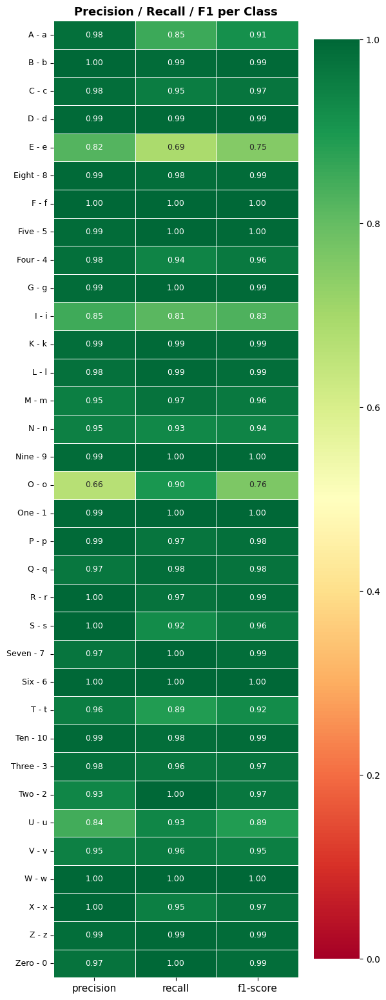

Saved: classification_report_heatmap.png


In [32]:
from sklearn.metrics import classification_report
import pandas as pd

report = classification_report(y_true, y_pred, target_names=classes, output_dict=True)
df_report = pd.DataFrame(report).transpose()

# Keep only per-class rows
df_plot = df_report.loc[classes, ['precision', 'recall', 'f1-score']]

plt.figure(figsize=(6, len(classes) * 0.4 + 2))
sns.heatmap(
    df_plot,
    annot=True,
    fmt='.2f',
    cmap='RdYlGn',
    linewidths=0.5,
    vmin=0, vmax=1,
    annot_kws={"size": 9}
)
plt.title('Precision / Recall / F1 per Class', fontsize=13, fontweight='bold')
plt.xticks(fontsize=11)
plt.yticks(rotation=0, fontsize=9)
plt.tight_layout()
plt.savefig('/kaggle/working/classification_report_heatmap.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: classification_report_heatmap.png")

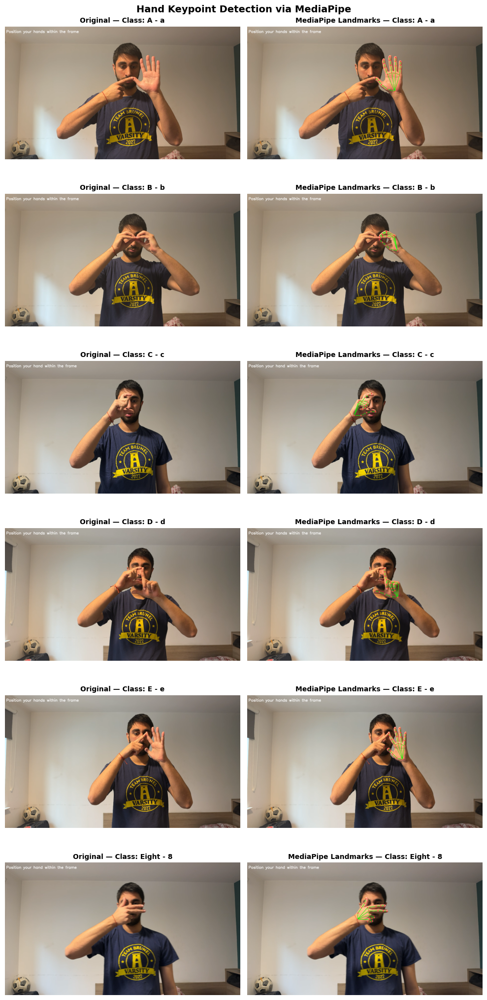

Saved: mediapipe_landmarks.png


In [35]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

# Hand connections for drawing
HAND_CONNECTIONS = [
    (0,1),(1,2),(2,3),(3,4),       # Thumb
    (0,5),(5,6),(6,7),(7,8),       # Index
    (0,9),(9,10),(10,11),(11,12),  # Middle
    (0,13),(13,14),(14,15),(15,16),# Ring
    (0,17),(17,18),(18,19),(19,20),# Pinky
    (5,9),(9,13),(13,17)           # Palm
]

def draw_landmarks_manual(image_rgb, landmarks):
    h, w, _ = image_rgb.shape
    annotated = image_rgb.copy()
    
    # Get pixel coords
    pts = [(int(lm.x * w), int(lm.y * h)) for lm in landmarks]
    
    # Draw connections
    for start, end in HAND_CONNECTIONS:
        cv2.line(annotated, pts[start], pts[end], (0, 255, 0), 2)
    
    # Draw landmark points
    for i, pt in enumerate(pts):
        cv2.circle(annotated, pt, 5, (255, 0, 0), -1)   # Blue filled
        cv2.circle(annotated, pt, 5, (255,255,255), 1)   # White border
    
    return annotated

# ── Pick sample images from multiple classes ──────────────────────────────
sample_classes = classes[:6]  # first 6 classes
fig, axes = plt.subplots(len(sample_classes), 2, figsize=(10, len(sample_classes) * 3.5))

for i, cls in enumerate(sample_classes):
    cls_dir = f'/kaggle/input/bsl-dataset-credits-to-eren-tatepe/1_HAND_DATASET/1_HAND_DATASET/{cls}'
    if not os.path.exists(cls_dir):
        cls_dir = f'/kaggle/input/bsl-dataset-credits-to-eren-tatepe/2_HAND_DATASET/2_HAND_DATASET/{cls}'
    
    img_file = os.listdir(cls_dir)[0]
    image    = cv2.imread(os.path.join(cls_dir, img_file))
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=image_rgb)
    results  = detector.detect(mp_image)
    
    axes[i, 0].imshow(image_rgb)
    axes[i, 0].set_title(f'Original — Class: {cls}', fontweight='bold', fontsize=10)
    axes[i, 0].axis('off')
    
    if results.hand_landmarks:
        annotated = draw_landmarks_manual(image_rgb, results.hand_landmarks[0])
        axes[i, 1].imshow(annotated)
        axes[i, 1].set_title(f'MediaPipe Landmarks — Class: {cls}', fontweight='bold', fontsize=10)
    else:
        axes[i, 1].set_title(f'No hand detected — Class: {cls}', fontsize=10)
    axes[i, 1].axis('off')

plt.suptitle('Hand Keypoint Detection via MediaPipe', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('/kaggle/working/mediapipe_landmarks.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: mediapipe_landmarks.png")